In [72]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/luna16/sampleSubmission.csv
/kaggle/input/luna16/annotations.csv
/kaggle/input/luna16/candidates.csv
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.311236942972970815890902714604.mhd
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.212346425055214308006918165305.mhd
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.281967919138248195763602360723.mhd
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.707218743153927597786179232739.raw
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.217697417596902141600884006982.mhd
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.283569726884265181140892667131.raw
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.192256506776434538421891524301.raw
/kaggle/input/luna16/subset2/subset2/1.3.6.1.4.1.14519.5.2.1.6279.6001.113586291551175790743673929831.raw
/kaggle/input/luna16/subset2/subset2/

In [73]:
# import libraries 
import numpy as np
import SimpleITK as sitk
import cv2
import tensorflow as tf
import pandas as pd
from sklearn.cluster import KMeans
import skimage, os
from skimage.morphology import ball, disk, dilation, binary_erosion, remove_small_objects, erosion, closing, reconstruction, binary_closing
from skimage.measure import label,regionprops, perimeter
from skimage.morphology import binary_dilation, binary_opening
from skimage.filters import roberts, sobel
from skimage import measure, feature
from skimage.segmentation import clear_border
from skimage import data
from scipy import ndimage as ndi
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import pydicom
import scipy.misc
import numpy as np

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

from subprocess import check_output
print(check_output(["ls", "../input/luna16"]).decode("utf8"))

annotations.csv
candidates.csv
candidates_V2
evaluationScript
sampleSubmission.csv
seg-lungs-LUNA16
subset0
subset1
subset2
subset3
subset4



In [74]:
print(check_output(["ls", "../input/luna16/subset0/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.mhd"]).decode("utf8"))

../input/luna16/subset0/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.mhd



In [75]:
# !pip install generators

In [76]:
import os
root = os.path.join(os.getcwd(),"../input/luna16/subset0/subset0")
paths = os.listdir(root)
print(paths)

['1.3.6.1.4.1.14519.5.2.1.6279.6001.313605260055394498989743099991.raw', '1.3.6.1.4.1.14519.5.2.1.6279.6001.139258777898746693365877042411.raw', '1.3.6.1.4.1.14519.5.2.1.6279.6001.154677396354641150280013275227.raw', '1.3.6.1.4.1.14519.5.2.1.6279.6001.295298571102631191572192562523.mhd', '1.3.6.1.4.1.14519.5.2.1.6279.6001.250863365157630276148828903732.mhd', '1.3.6.1.4.1.14519.5.2.1.6279.6001.310548927038333190233889983845.raw', '1.3.6.1.4.1.14519.5.2.1.6279.6001.128023902651233986592378348912.mhd', '1.3.6.1.4.1.14519.5.2.1.6279.6001.303421828981831854739626597495.raw', '1.3.6.1.4.1.14519.5.2.1.6279.6001.188209889686363159853715266493.raw', '1.3.6.1.4.1.14519.5.2.1.6279.6001.975254950136384517744116790879.mhd', '1.3.6.1.4.1.14519.5.2.1.6279.6001.295298571102631191572192562523.raw', '1.3.6.1.4.1.14519.5.2.1.6279.6001.227962600322799211676960828223.mhd', '1.3.6.1.4.1.14519.5.2.1.6279.6001.621916089407825046337959219998.mhd', '1.3.6.1.4.1.14519.5.2.1.6279.6001.5340065752569433904792527715

In [77]:
import SimpleITK as sitk
for path in paths:
    if path.find('mhd')>=0:
        data =sitk.ReadImage(os.path.join(root,path))
        print(data)

Image (0x560c4d431ea0)
  RTTI typeinfo:   itk::Image<short, 3u>
  Reference Count: 1
  Modified Time: 44790
  Debug: Off
  Object Name: 
  Observers: 
    none
  Source: (none)
  Source output name: (none)
  Release Data: Off
  Data Released: False
  Global Release Data: Off
  PipelineMTime: 44760
  UpdateMTime: 44786
  RealTimeStamp: 0 seconds 
  LargestPossibleRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [512, 512, 232]
  BufferedRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [512, 512, 232]
  RequestedRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [512, 512, 232]
  Spacing: [0.703125, 0.703125, 1.25]
  Origin: [-214.7, -164, -304.25]
  Direction: 
1 0 0
0 1 0
0 0 1

  IndexToPointMatrix: 
0.703125 0 0
0 0.703125 0
0 0 1.25

  PointToIndexMatrix: 
1.42222 0 0
0 1.42222 0
0 0 0.8

  Inverse Direction: 
1 0 0
0 1 0
0 0 1

  PixelContainer: 
    ImportImageContainer (0x560c4d3b71a0)
      RTTI typeinfo:   itk::ImportImageContainer<unsigned long, short>
  

In [78]:
def plot_ct_scan(scan, num_column=4, jump=1):
    num_slices = len(scan)
    num_row = (num_slices//jump + num_column - 1) // num_column
    f, plots = plt.subplots(num_row, num_column, figsize=(num_column*5, num_row*5))
    for i in range(0, num_row*num_column):
        plot = plots[i % num_column] if num_row == 1 else plots[i // num_column, i % num_column]        
        plot.axis('off')
        if i < num_slices//jump:
            plot.imshow(scan[i*jump], cmap=plt.cm.bone) 

spacing:  (0.6445310115814209, 0.6445310115814209, 2.5)
# slice:  120


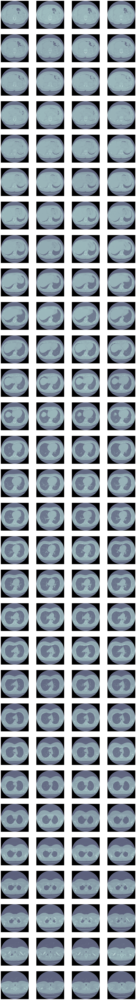

In [79]:
import matplotlib.pyplot as plt
import SimpleITK as sitk   
import matplotlib.pyplot as plt
%matplotlib inline   
spacing = data.GetSpacing()
scan = sitk.GetArrayFromImage(data)
print('spacing: ', spacing)
print('# slice: ', len(scan))
plot_ct_scan(scan)

120


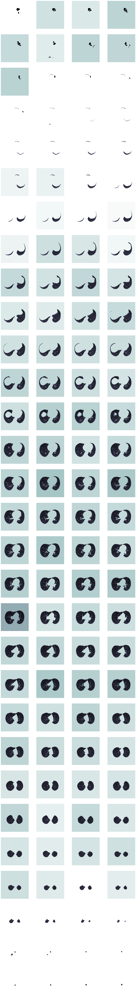

In [80]:
from skimage.segmentation import clear_border
from skimage.measure import label,regionprops, perimeter
from skimage.morphology import ball, disk, dilation, binary_erosion, remove_small_objects, erosion, closing, reconstruction, binary_closing
from skimage.filters import roberts, sobel
from scipy import ndimage as ndi
import scipy.ndimage
import numpy as np
import matplotlib.pyplot as plt

def get_segmented_lungs(im, spacing, threshold = -400):
    
    '''
    This funtion segments the lungs from the given 2D slice.
    '''
    '''
    Step 1: Convert into a binary image. 
    '''
    binary = im < threshold

    '''
    Step 2: Remove the blobs connected to the border of the image.
    '''
    cleared = clear_border(binary)

    '''
    Step 3: Label the image.
    '''
    label_image = label(cleared)
    
    '''
    Step 4: Keep the labels with 2 largest areas.
    '''
    areas = [r.area for r in regionprops(label_image)]
    areas.sort()
    if len(areas) > 2:
        for region in regionprops(label_image):
            if region.area < areas[-2]:
                for coordinates in region.coords:                
                       label_image[coordinates[0], coordinates[1]] = 0
    binary = label_image > 0

    '''
    Step 5: Erosion operation with a disk of radius 2. This operation is 
    seperate the lung nodules attached to the blood vessels.
    '''
    selem = disk(2)
    binary = binary_erosion(binary, selem)

    '''
    Step 6: Closure operation with a disk of radius 10. This operation is 
    to keep nodules attached to the lung wall.
    '''
    selem = disk(10)
    binary = binary_closing(binary, selem)

    edges = roberts(binary)
    binary = ndi.binary_fill_holes(edges)

    return binary

    
path = paths[0]
#data =  sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(root,path)))
spacing = data.GetSpacing()
scan = sitk.GetArrayFromImage(data)
print(scan.shape[0])

mask = np.array([get_segmented_lungs(slice.copy(), spacing) for slice in scan])
scan[~mask] = 0
plot_ct_scan(scan, jump=1)

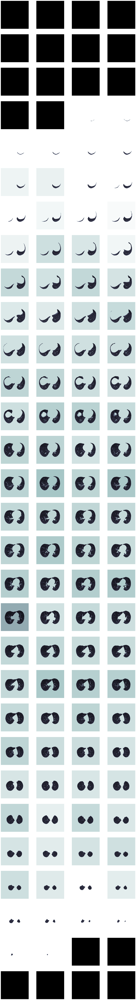

In [81]:
from skimage import measure
def extract_main(mask, spacing, vol_limit=[0.68, 8.2]):
    
    voxel_vol = spacing[0]*spacing[1]*spacing[2]

    label = measure.label(mask, connectivity=1)

    properties = measure.regionprops(label)

    for prop in properties:
            if prop.area * voxel_vol < vol_limit[0] * 1e6 or prop.area * voxel_vol > vol_limit[1] * 1e6:
                mask[label == prop.label] = 0
                
    return mask

mask = extract_main(mask, spacing)
scan[~mask] = 0
plot_ct_scan(scan, jump=1)

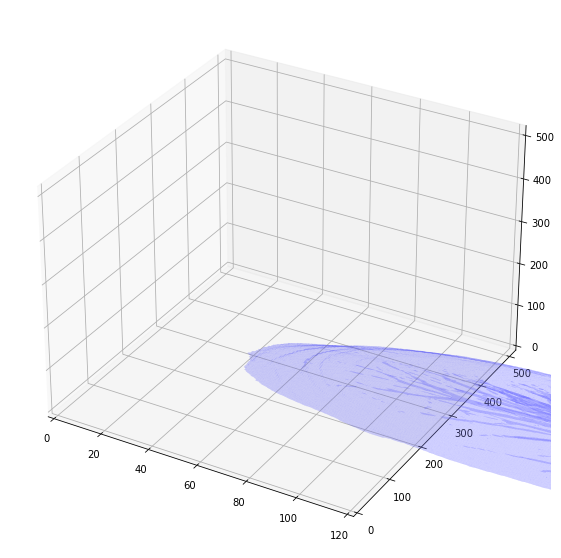

In [82]:
def plot_3d(image, threshold=-300):
    # Position the scan upright, 
    # so the head of the patient would be at the top facing the camera
    p = image.transpose(2,1,0)

    # Extract the iso-surface at the threshold value
    verts, faces, _, _ = measure.marching_cubes(p, threshold)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: `verts[faces]` to generate a collection of triangles
    mesh = Poly3DCollection(verts[faces], alpha=0.2)
    face_color = [0.5, 0.5, 1]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, image.shape[0])
    ax.set_ylim(0, image.shape[1])
    ax.set_zlim(0, image.shape[2])

    plt.show()


plot_3d(scan)

In [83]:
def get_segmented_lungs(im, plot=False):
  
    binary = im < -320
    cleared = clear_border(binary)
    label_image = label(cleared)
    areas = [r.area for r in regionprops(label_image)]
    areas.sort()
    if len(areas) > 2:
        for region in regionprops(label_image):
            if region.area < areas[-2]:
                for coordinates in region.coords:                
                       label_image[coordinates[0], coordinates[1]] = 0
    binary = label_image > 0
    selem = disk(2)
    binary = binary_erosion(binary, selem)
    selem = disk(10)
    binary = binary_closing(binary, selem)

    edges = roberts(binary)
    binary = ndi.binary_fill_holes(edges)
    
    if plot:
        plt.subplot(121)
        plt.imshow(im, cmap=plt.cm.bone)
        plt.subplot(122)
        plt.imshow(binary, cmap=plt.cm.bone)
        plt.show()
    
    return binary

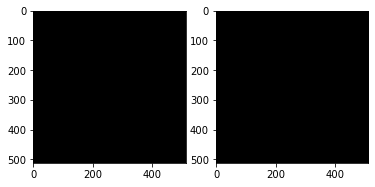

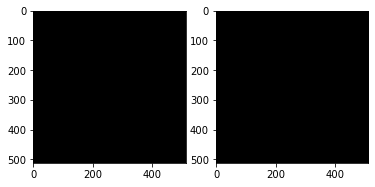

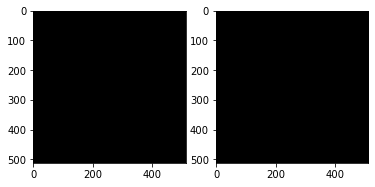

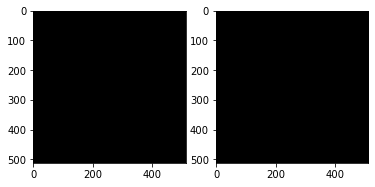

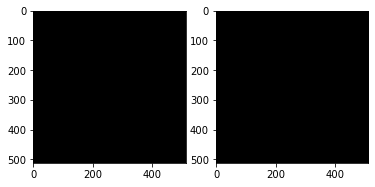

...

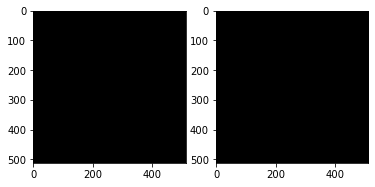

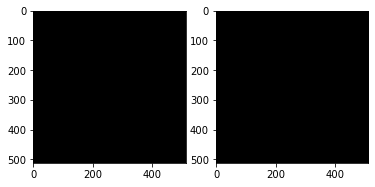

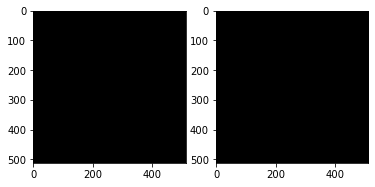

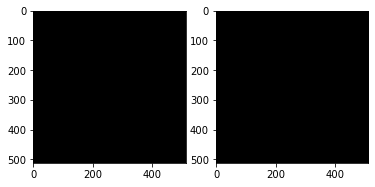

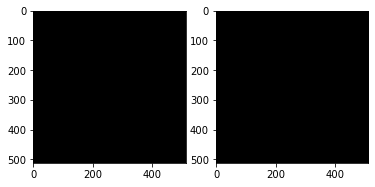

TypeError: get_segmented_lungs() got an unexpected keyword argument 'jump'

In [84]:
mask = np.array([get_segmented_lungs(slice.copy(), spacing) for slice in scan])
scan[~mask] = 0
get_segmented_lungs(scan, jump=1)

In [ ]:
def random_rotation(image_array: np.ndarray):
    # convert 1D array to 2D array
    if image_array.ndim == 1:
        image_array = image_array.reshape(1, -1)

    # pick a random degree of rotation between 25% on the left and 25% on the right
    random_degree = random.uniform(-25, 25)
    rotated_image = scipy.ndimage.interpolation.rotate(image_array, random_degree, mode='nearest')

    # convert 2D array back to 1D array
    if image_array.shape[0] == 1:
        rotated_image = rotated_image.reshape(-1)

    return rotated_image

random_rotation(scan[0])

In [ ]:
import random
import numpy as np
import scipy.ndimage
import matplotlib.pyplot as plt

def random_rotation(image_array: np.ndarray):
    # convert 1D array to 2D array
    if image_array.ndim == 1:
        image_array = image_array.reshape(1, -1)

    # pick a random degree of rotation between 25% on the left and 25% on the right
    random_degree = random.uniform(-25, 25)
    rotated_image = scipy.ndimage.interpolation.rotate(image_array, random_degree, mode='nearest')

    # convert 2D array back to 1D array
    if image_array.shape[0] == 1:
        rotated_image = rotated_image.reshape(-1)

    return rotated_image

def random_noise(image_array: np.ndarray):
    # add random noise to the image
    mean = 0
    var = 0.1
    sigma = var ** 0.5
    noisy_image = image_array + np.random.normal(mean, sigma, image_array.shape)
    return np.clip(noisy_image, 0, 1)

def horizontal_flip(image_array: np.ndarray):
    # flip the image horizontally
    flipped_image = np.fliplr(image_array)
    return flipped_image

# read images and masks
mask = np.array([get_segmented_lungs(slice.copy(), spacing) for slice in scan])
scan[~mask] = 0

# augment images and masks
augmented_images = []
augmented_masks = []
for image, mask in zip(scan, np.nditer(mask)):
    augmented_images.append(random_rotation(image))
    mask_2d = np.squeeze(mask)
    augmented_masks.append(random_rotation(mask_2d))

# random noise
for image, mask in zip(scan, np.nditer(mask)):
    augmented_images.append(random_noise(image))
    mask_2d = np.squeeze(mask)
    augmented_masks.append(random_noise(mask_2d))

# horizontal flip
for image, mask in zip(scan, np.nditer(mask)):
    augmented_images.append(horizontal_flip(image))
    mask_2d = np.squeeze(mask)
    augmented_masks.append(horizontal_flip(mask_2d))

# show 3 pairs of augmented images and masks
fig, ax = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
    ax[i, 0].imshow(scan[i])
    ax[i, 1].imshow(augmented_images[i])
    ax[i, 2].imshow(augmented_masks[i])
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import pydicom
import random
import scipy.ndimage
import scipy.misc
import scipy.ndimage
import scipy.misc
import skimage
from skimage import measure, morphology
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from skimage.transform import resize
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import log_loss
from sklearn.metrics import brier_score_loss
from sklearn.metrics import jaccard_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras import losses
from tensorflow.keras import metrics
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization, Activation, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam

In [ ]:
# # Split the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(scan, mask, test_size=0.2, random_state=42)

# # Define the machine learning model
# model = Sequential()
# model.add(Conv2D(filters=8, kernel_size=(3,3), padding='Same', activation='relu', input_shape=(512,512,1)))
# model.add(MaxPool2D(pool_size=(2,2)))
# model.add(Dropout(0.25))

# # Compile the model
# model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# # Train the model
# history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)

# # Evaluate the model on the testing set
# score = model.evaluate(X_test, y_test)

# # Make predictions using the trained model
# y_pred = model.predict(X_test)


In [ ]:
#split the data into X and y 
X = scan
y = mask

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the machine learning model
model = Sequential()
model.add(Conv2D(filters=8, kernel_size=(3,3), padding='Same', activation='relu', input_shape=(512,512,1)))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)

# Evaluate the model on the testing set
score = model.evaluate(X_test, y_test)

# Make predictions using the trained model
y_pred = model.predict(X_test)


In [ ]:
mask = np.array([get_segmented_lungs(slice.copy(), spacing) for slice in scan])
scan[~mask] = 0

model = Sequential()

model.add(Conv2D(filters = 8, kernel_size = (3,3),padding = 'Same',
                    activation ='relu', input_shape = (512,512,1)))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(filters = 16, kernel_size = (3,3),padding = 'Same',
                    activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(filters = 32, kernel_size = (3,3),padding = 'Same',
                    activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same',
                    activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(256, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(2, activation = "softmax"))

# Define the optimizer
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Compile the model
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])

# Set a learning rate annealer
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc',
                                            patience=3, 
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)

epochs = 1
batch_size = 86

